# Analiza i przetwarzanie obrazów

# Sprawozdanie 1

# Przemysław Rewiś

## Ćwiczenie laboratoryjne nr 2

### Reprezentacja obrazu i koloru 

### a) 

In [1]:
import cv2 #import biblioteki OpenCV
from matplotlib import pyplot as plt #import biblioteki Matplotlib
#Wczytanie obrazu w przestrzeni barw BGR 
bgr_img=cv2.imread("lab2.jpg") 


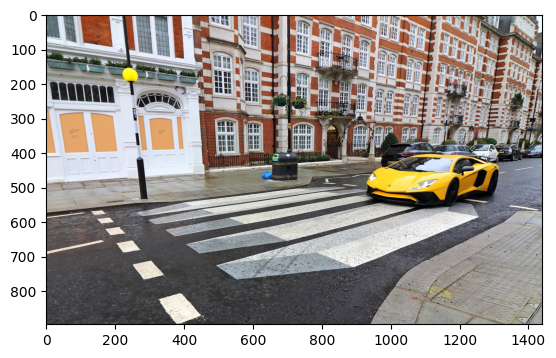

In [2]:
#Wyświetlenie wczytanego obrazu
plt.imshow(cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB))

Biblioteka Matplotlib domyślnie korzysta z przestrzeni barw RGB,
a biblioteka OpenCV z przestrzeni barw BGR,
więc aby obraz poprawnie się wyświetlał trzeba
wykonać konwersję wczytanego obrazu z BGR do RGB. Używamy do tego metody cv2.cvtColor przyjmuje ona jako parametr obraz i flagę określającą kierunek konwersji 

### b) 

In [3]:
#Konwersja obrazu do skali szarości.
img_grayscale=cv2.cvtColor(bgr_img,cv2.COLOR_BGR2GRAY)


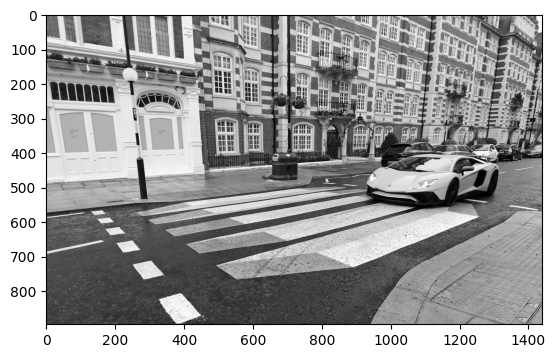

In [4]:
#Wyświetlenie obrazu w skali szarości
plt.imshow(img_grayscale, cmap='gray')

Parametr cmap='gray' służy do określenia, że chcemy wyświetlić obraz w skali szarości.

Wynikowy obraz nie jest tworzony po prostu przez dodanie składowych R+G+B z wagą 1, ponieważ ludzkie oko jest bardziej wrażliwe na niektóre kolory niż na inne. Do konwersji obrazów kolorowych na skalę szarości najczęściej używany jest wzór NTSC, który służy do obliczania luminancji: 

Y = 0.299R + 0.587G + 0.114B

Konwersja z BGR do skali szarości z użyciem powyższego wzoru bierze pod uwagę tę wrażliwość i daje bardziej naturalny i poprawny wynik.

### c)

In [5]:
#Rozdzielenie składowych RGB obrazu R - czerwona, G - zielona,
#B - niebieska za pomocą metody cv2.split przyjmuje ona jako 
#parametr obraz 
b, g, r = cv2.split(bgr_img)

Text(0.5, 1.0, 'Składowa R')

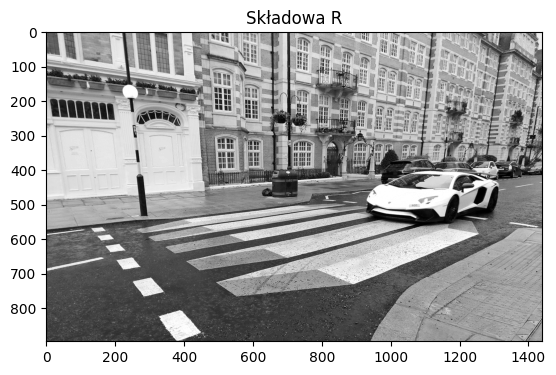

In [6]:
#Wyświetlenie trzech obrazów w skali szarości odpowiadających 
#intensywności pierwotnego obrazu osobno w składowych R, G i B
plt.imshow(r, cmap='gray')
plt.title('Składowa R') #ustawienie tytułu obrazu


Text(0.5, 1.0, 'Składowa G')

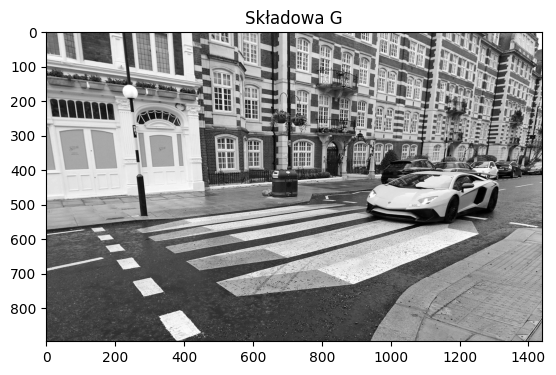

In [7]:
plt.imshow(g, cmap='gray')
plt.title('Składowa G')

Text(0.5, 1.0, 'Składowa B')

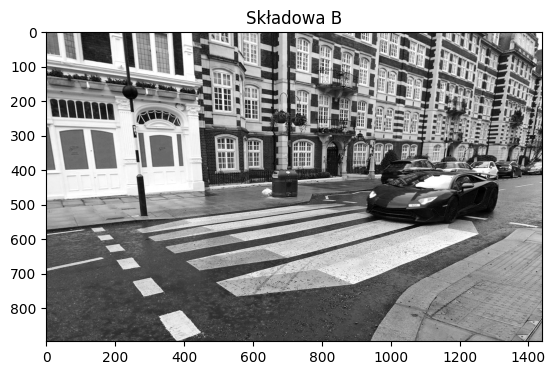

In [8]:
plt.imshow(b, cmap='gray')
plt.title('Składowa B')

### d)

In [9]:
#Konwersja obrazu do skali HSV H – Kolor/Odcień, S – Nasycenie, 
#V – Wartość
hsv_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2HSV)

In [10]:
#Rozdzielenie składowych HSV obrazu
h, s, v = cv2.split(hsv_img)

Text(0.5, 1.0, 'Składowa H')

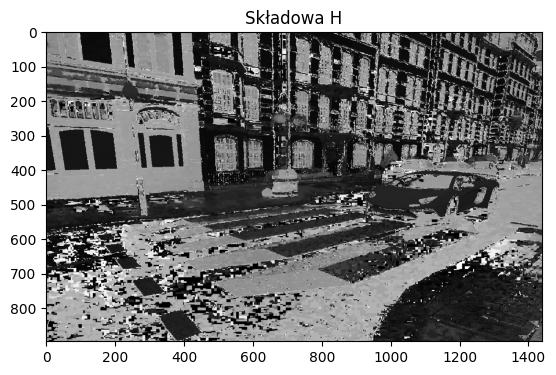

In [11]:
#Wyświetlenie trzech obrazów w skali szarości odpowiadających 
#pierwotnego obrazu osobno w składowych H, S i V 
plt.imshow(h, cmap='gray')
plt.title('Składowa H')


Text(0.5, 1.0, 'Składowa S')

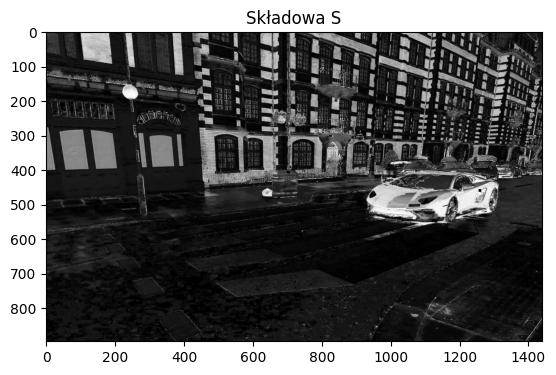

In [12]:
plt.imshow(s, cmap='gray')
plt.title('Składowa S')

Text(0.5, 1.0, 'Składowa V')

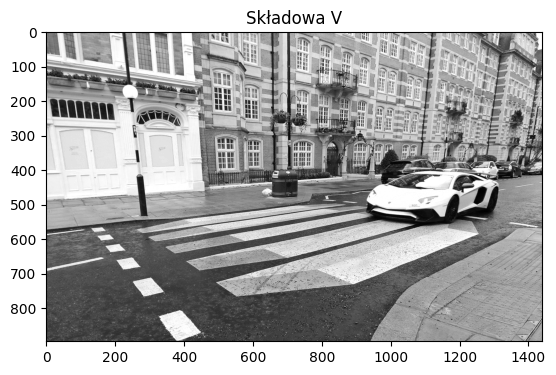

In [13]:
plt.imshow(v, cmap='gray')
plt.title('Składowa V')

### e)

In [14]:
#Określenie górnej i dolnej granicy koloru żółtego w HSV
lower_yellow = (20, 115, 115)
upper_yellow = (26, 255, 255)

In [15]:
#Stworzenie maski zawierającej wszystkie piksele w danym przedziale
mask = cv2.inRange(hsv_img, lower_yellow, upper_yellow)

In [16]:
#Nakładamy powyższą maskę bitowym ANDem, aby wybrać żółty samochód
car=cv2.bitwise_and(bgr_img,bgr_img,mask=mask)

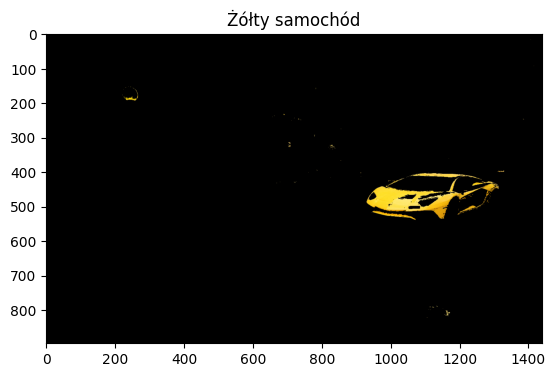

In [17]:
#Wyświetlenie wyniku
plt.imshow(cv2.cvtColor(car, cv2.COLOR_BGR2RGB))
plt.title('Żółty samochód')
plt.show()

Uzyskany wynik nie jest idealny. Fragmenty maski i drzwi samochodu nie są widoczne. Dodatkowo zostały wycięte fragmenty np. lampy ulicznej, których nie powinno być widać. Jest to spowodowane określeniem górnej i dolnej granicy koloru żółtego.

Realizujemy to w skali HSV, ponieważ oddziela ona informację o kolorze od informacji o jasności. Ta separacja ułatwia identyfikację konkretnego koloru (w naszym przypadku żółtego) niezależnie od jego jasności lub intensywności na obrazie. W przestrzeni barw HSV składowa barwy - H reprezentuje informację o kolorze, natomiast składowe nasycenia - S i wartości - V reprezentują informację o jasności. 

### e)

Korzystając z wcześniej rozdzielonych składowych RGB obrazu obliczamy
za pomocą fukcji cv2.calcHist(images, channels, mask, histSize, ranges[, hist[,
accumulate]])
jej parametrami są
- images – obraz, podawany w nawiasach kwadratowych w naszym przypadku jedna ze składowych z c), np. [r]
- channels – kanał dla którego liczymy, u nas wystarczy [0], 
- mask – pozwala na podanie maski u nas obliczamy histogram dla całego obrazu więc None,
- histSize – liczba binów, np. [256],
- ranges – zakres binów – typowo [0,256].

In [18]:
#Obliczanie histogramów dla trzech składowych R,G,B
histogram_r = cv2.calcHist([r], [0], None, [256], [0, 256])
histogram_g = cv2.calcHist([g], [0], None, [256], [0, 256])
histogram_b = cv2.calcHist([b], [0], None, [256], [0, 256])

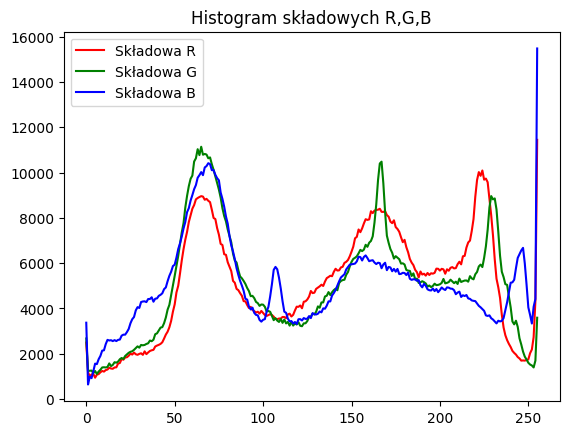

In [19]:
#Wyświetlenie wyników
plt.plot(histogram_r, color='r', label='Składowa R')
plt.plot(histogram_g, color='g', label='Składowa G')
plt.plot(histogram_b, color='b', label='Składowa B')
plt.legend()
plt.title('Histogram składowych R,G,B')
plt.show()

### f)

In [20]:
import numpy as np
#OpenCV nie zawiera funkcji rozciągania kontrastu, należy 
#to zrobić ręcznie dokonując operacji ((pixel – min) / (max – min))*255
min_val = np.min(img_grayscale) #znajdujemy minimum
max_val = np.max(img_grayscale) #znajdujemy maksimum
contrast_img = ((img_grayscale - min_val) / (max_val - min_val)) * 255
contrast_img = contrast_img.astype(np.uint8)

Po zastosowaniu operacji rozciągania kontrastu, wynikowy obraz ma wartości pikseli, które nie mieszczą się w zakresie 0-255, więc musimy użyć funkcji astype() z typem danych np.uint8, aby przekonwertować wartości pikseli na zakres 0-255. To zapewnia, że wynikowy obraz zawiera wartości pikseli, które mogą być wyświetlone przy użyciu funkcji imshow().

In [21]:
#Wyrównanie histogramu można użyć funkcji cv2.equalizeHist()
#przyjmuje ona jako parametr obraz
equalized_img = cv2.equalizeHist(img_grayscale)

Funkcja ta stosuje globalne wyrównanie histogramu do obrazu, co powoduje rozłożenie wartości intensywności w całym zakresie. Może to pomóc w poprawieniu kontrastu i szczegółowości obrazu.

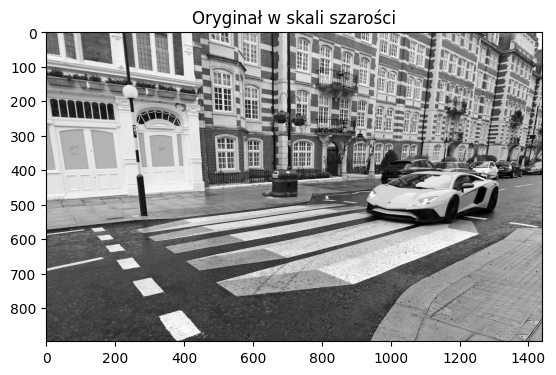

In [22]:
#Wyświetlenie wyników
plt.title('Oryginał w skali szarości')
plt.imshow(img_grayscale, cmap='gray')

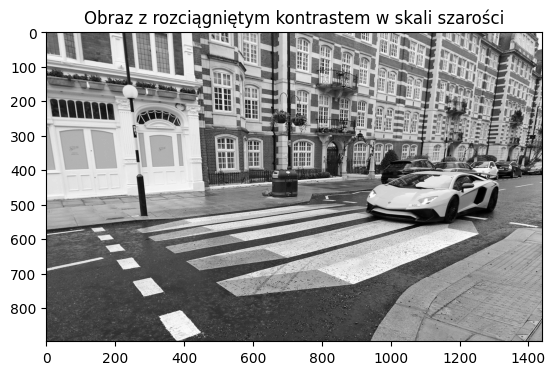

In [23]:
plt.title('Obraz z rozciągniętym kontrastem w skali szarości')
plt.imshow(contrast_img, cmap='gray')

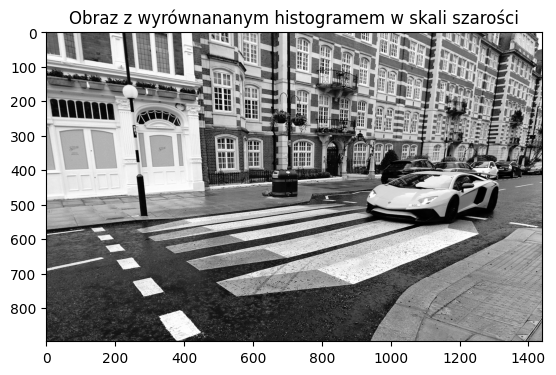

In [24]:
plt.title('Obraz z wyrównananym histogramem w skali szarości')
plt.imshow(equalized_img, cmap='gray')

Rozciąganie kontrastu polega na zwiększeniu różnicy między maksymalną wartością intensywności w obrazie a minimalną. Wszystkie pozostałe wartości intensywności są rozłożone pomiędzy tym zakresem.

Wyrównanie histogramu polega na modyfikacji wartości intensywności wszystkich pikseli na obrazie w taki sposób, aby histogram został "spłaszczony" (w rzeczywistości histogram nie może być dokładnie spłaszczony, byłyby pewne szczyty i pewne doliny, ale to problem praktyczny).

W przypadku rozciągania kontrastowego istnieje relacja jeden do jednego wartości intensywności pomiędzy obrazem źródłowym a docelowym, tzn. oryginalny obraz może być odtworzony z obrazu rozciągniętego kontrastowo.

Jednak po wykonaniu wyrównania histogramu nie ma możliwości odzyskania oryginalnego obrazu.

## Ćwiczenie laboratoryjne nr 3

### Progowanie i segmentacja

### a)

In [25]:
#Wczytanie obrazu w przestrzeni barw BGR 
bgr_img = cv2.imread("lab3_1.jpg")
#Konwersja obrazu do skali szarości.
img_grayscale = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2GRAY)

### b)

In [26]:
#Globalne progowanie przy użyciu różnych trybów
ret,binary_img = cv2.threshold(img_grayscale, 120, 255, cv2.THRESH_BINARY)
ret,binary_inv_img = cv2.threshold(img_grayscale, 120, 255, cv2.THRESH_BINARY_INV)
ret,trunc_img = cv2.threshold(img_grayscale, 120, 255, cv2.THRESH_TRUNC)
ret,tozero_img = cv2.threshold(img_grayscale, 120, 255, cv2.THRESH_TOZERO)
ret,tozero_inv_img = cv2.threshold(img_grayscale, 120, 255, cv2.THRESH_TOZERO_INV)

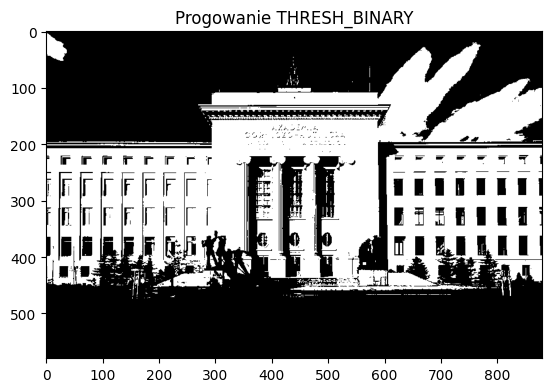

In [27]:
#Wyświetlenie wyników
plt.title('Progowanie THRESH_BINARY')
plt.imshow(binary_img, cmap='gray')

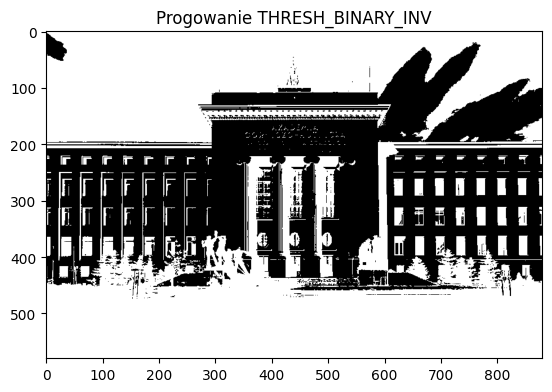

In [28]:
plt.title('Progowanie THRESH_BINARY_INV')
plt.imshow(binary_inv_img, cmap='gray')

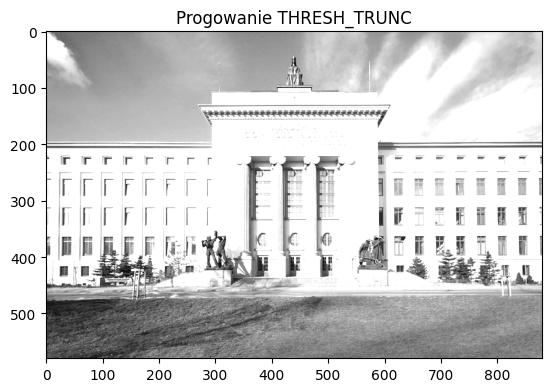

In [29]:
plt.title('Progowanie THRESH_TRUNC')
plt.imshow(trunc_img, cmap='gray')

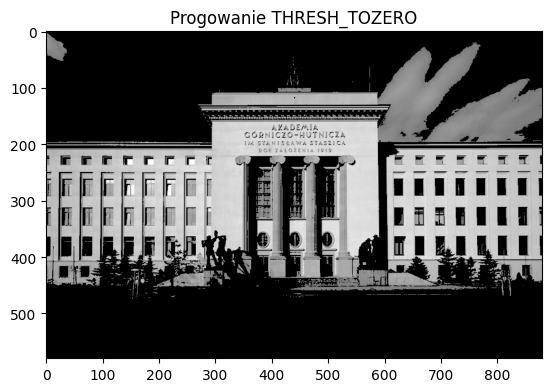

In [30]:
plt.title('Progowanie THRESH_TOZERO')
plt.imshow(tozero_img, cmap='gray')

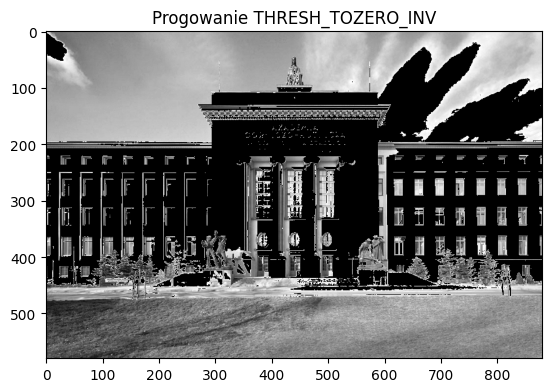

In [31]:
plt.title('Progowanie THRESH_TOZERO_INV')
plt.imshow(tozero_inv_img, cmap='gray')

Wykorzystana przez nas funkcja cv2.threshold() służy do wykonania progowania na wejściowym obrazie w skali szarości. Przyjmuje ona następujące parametry:

1. src: wejściowy obraz w skali szarości. Powinna to być tablica numpy 2D.
2. thresh: wartość progowa (u nas 120) używana do operacji progowania. Wartości pikseli powyżej tej wartości zostaną ustawione na maksymalną wartość określoną przez parametr maxval, a wartości pikseli poniżej tej wartości zostaną ustawione na 0
3. maxval: maksymalna wartość, jaką można przypisać pikselowi po progowaniu (u nas 255)
4. type: typ progowania, który ma być zastosowany. Może to być jeden z następujących:
    - cv2.THRESH_BINARY: piksele o natężeniach powyżej wartości progowej są ustawiane na maxval, a piksele o natężeniach poniżej wartości progowej są ustawiane na 0.
    - cv2.THRESH_BINARY_INV: piksele o intensywności powyżej wartości progowej są ustawione na 0, a piksele o intensywności poniżej wartości progowej są ustawione na maxval.
    - cv2.THRESH_TRUNC: piksele o intensywności powyżej wartości progowej są ustawiane na wartość progową, a piksele o intensywności poniżej wartości progowej są ustawiane na ich oryginalną wartość.
    - cv2.THRESH_TOZERO: piksele o intensywności poniżej wartości progowej są ustawiane na 0, a piksele o intensywności powyżej wartości progowej są ustawiane na ich oryginalną wartość.
    - cv2.THRESH_TOZERO_INV: piksele o intensywności poniżej wartości progowej są ustawiane na wartość oryginalną, a piksele o intensywności powyżej wartości progowej są ustawiane na 0.
   
Zwraca ona dwie wartości: ret i thresh:

1. ret jest wartością progową, która została użyta do progowania. Jeśli tryb progowania jest adaptacyjny, to ret może nie reprezentować rzeczywistej wartości progowej użytej, ale dla globalnego progowania, ret będzie równe określonej wartości progowej.

U nas ret będzie zawierał wartość progową 120 dla wszystkich trybów progowania.

2. thresh jest obrazem progowanym, czyli obrazem binarnym uzyskanym po progowaniu obrazu wejściowego img. Obraz progowy otrzymywany jest przez porównanie wartości pikseli obrazu wejściowego z wartością progową.



### c)

In [32]:
#Progowanie adaptacyjne o wielkości bloku 199 i stałej 5.
thresh_adaptive_mean = cv2.adaptiveThreshold(img_grayscale, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 199, 5)
thresh_adaptive_gaussian = cv2.adaptiveThreshold(img_grayscale, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 199, 5)

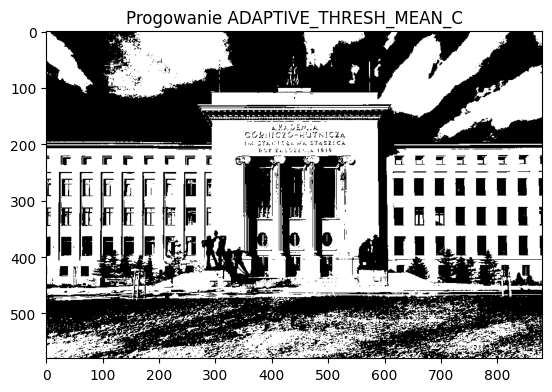

In [33]:
#Wyświetlenie wyników
plt.title('Progowanie ADAPTIVE_THRESH_MEAN_C')
plt.imshow(thresh_adaptive_mean, cmap='gray')

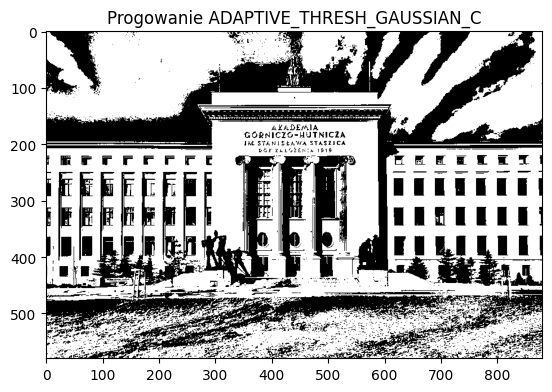

In [34]:
plt.title('Progowanie ADAPTIVE_THRESH_GAUSSIAN_C')
plt.imshow(thresh_adaptive_gaussian, cmap='gray')

Progowanie adaptacyjne jest wykorzystywane, gdy oświetlenie lub kontrast obrazu nie są spójne na całej powierzchni. Wykorzystana przez nas funkcja cv2.adaptiveThreshold() służy do wykonania progowania na wejściowym obrazie w skali szarości. Przyjmuje ona następujące parametry:
1. src: wejściowy obraz w skali szarości
2. maxval: maksymalna wartość, jaką można przypisać pikselowi po progowaniu (u nas 255)
3. adaptivemethod: metoda stosowana do obliczania wartości progowej. Może to być jedna z dwóch opcji:
    - cv2.ADAPTIVE_THRESH_MEAN_C – próg wyznaczany na podstawie średniej intensywności w otoczeniu
    - cv2.ADAPTIVE_THRESH_GAUSSIAN_C – próg wyznaczany jest na podstawie średniej ważonej intensywności sąsiednich pikseli z wagami wyznaczonymi z rozkładu Gaussa
4. thresholdtype: typ progowania, który ma zostać wykonany (u nas cv2.THRESH_BINARY)     
5. blockSize (rozmiar bloku): określa rozmiar otoczenia branego pod uwagę przy obliczaniu lokalnego progu (u nas 199) co oznacza, że wartość progowa jest obliczana na podstawie wartości pikseli w sąsiedztwie 199x199 wokół każdego piksela.
6. C: stała odejmowana od średniej/średniej ważonej (u nas 5)

Rozmiar sąsiedztwa (blockSize) może mieć znaczący wpływ na wynik progowania adaptacyjnego. Większe rozmiary sąsiedztwa mogą skutkować gładszymi obrazami progowymi z mniejszym szumem, ale mogą również prowadzić do utraty szczegółów. Mniejsze rozmiary sąsiedztwa mogą skutkować bardziej szczegółowymi obrazami progowymi, ale mogą również wprowadzić więcej szumu.

Wybór metody progowania adaptacyjnego i optymalnych wartości parametrów (blockSize i C) zależy od konkretnego zastosowania i właściwości obrazu wejściowego. Zdaniem autora lepsze wyniki dała metoda cv2.ADAPTIVE_THRESH_GAUSSIAN_C, ponieważ obraz jest ostrzejszy. Napis z nazwą uczelni na obrazie jest najlepiej widoczny w porównaniu do wyników uzyskanych ze wszystkich innych metod progowania, co mogłoby ułatwić stworzenie programu np. do wykrywania i rozpoznawania tekstu na zdjęciach.

### d)

In [35]:
#Progowanie metodą Otsu
ret,otsu_img = cv2.threshold(img_grayscale, 120, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

Metoda Otsu polega na znalezieniu podziału który minimalizuje wariancję (zmienność) w ramach każdej z dwóch klas uzyskanych w ramach podziału.

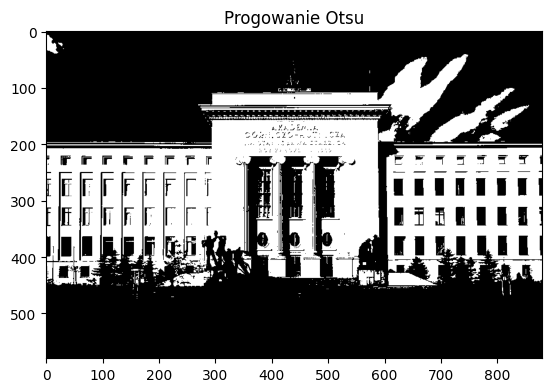

In [36]:
#Wyświetlenie wyniku
plt.title('Progowanie Otsu')
plt.imshow(otsu_img, cmap='gray')

In [37]:
#Obliczanie histogramu dla obrazu
hist = cv2.calcHist([img_grayscale], [0], None, [256], [0, 256])

Uzyskana wartość progu:  133.0


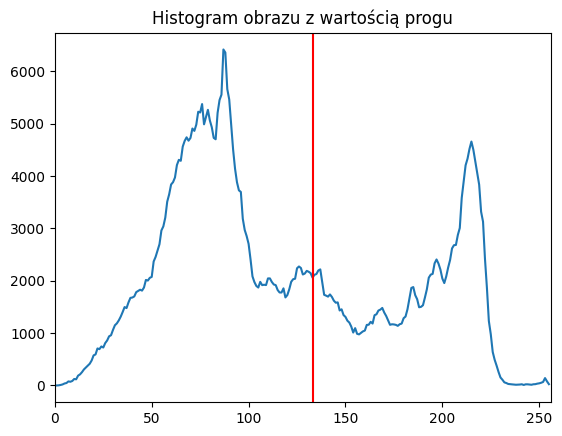

In [38]:
#Wyświetlenie wyniku
print('Uzyskana wartość progu: ',ret)
plt.plot(hist)
plt.title('Histogram obrazu z wartością progu')
#Dodajemy pionową linię na wartości progowej
plt.axvline(x=ret, color='r') 
plt.xlim([0, 256])
plt.show()

### e)

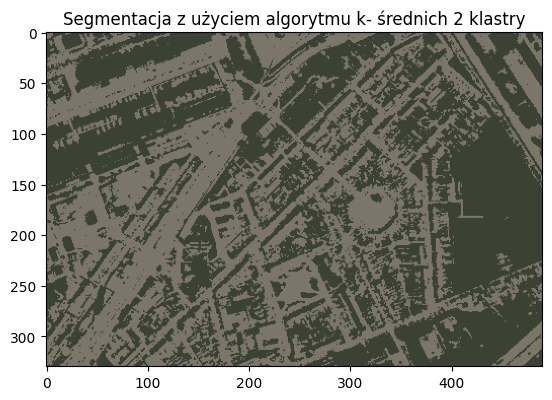

In [39]:
#Wczytywanie obrazu
img2 = cv2.imread('lab3_2.png')

#Konwersja obrazu na tablicę numpy
img2 = np.float32(img2)

#Przekształcenie obrazu w dwuwymiarową tablicę pikseli
pixels = img2.reshape((-1, 3))

#Określenie liczby klastrów
K = 2

#Określenie kryteriów dla algorytmu k-średnich
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)

#Segmentacja metodą k-średnich
ret, labels, centers = cv2.kmeans(pixels, K, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

#Zmiana kształtu etykiet i środków,
#aby dopasować je do oryginalnego kształtu obrazu
labels = labels.reshape((img2.shape[0], img2.shape[1]))
centers = np.uint8(centers)
res = centers[labels]

#Wyświetlenie wyniku
plt.imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB))
plt.title('Segmentacja z użyciem algorytmu k- średnich 2 klastry')
plt.show()



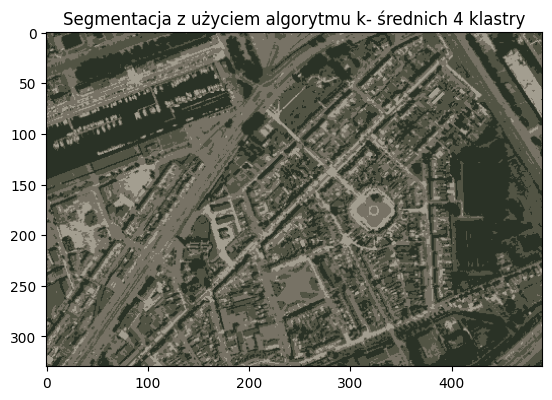

In [40]:
#Segmentacja z użyciem algorytmu k- średnich na 4 klastry
K = 4
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
ret, labels, centers = cv2.kmeans(pixels, K, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
labels = labels.reshape((img2.shape[0], img2.shape[1]))
centers = np.uint8(centers)
res = centers[labels]

#Wyświetlenie wyniku
plt.imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB))
plt.title('Segmentacja z użyciem algorytmu k- średnich 4 klastry')
plt.show()

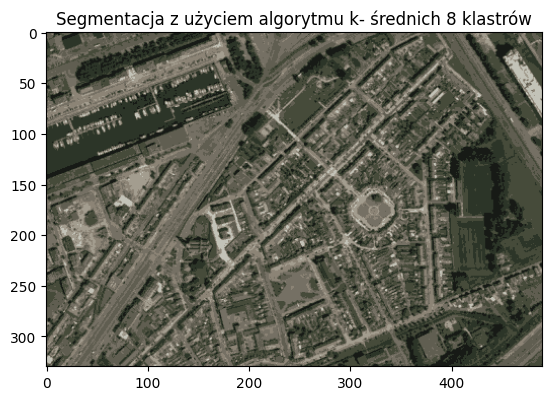

In [41]:
#Segmentacja z użyciem algorytmu k- średnich na 8 klastrów
K = 8
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
ret, labels, centers = cv2.kmeans(pixels, K, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
labels = labels.reshape((img2.shape[0], img2.shape[1]))
centers = np.uint8(centers)
res = centers[labels]

#Wyświetlenie wyniku
plt.imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB))
plt.title('Segmentacja z użyciem algorytmu k- średnich 8 klastrów')
plt.show()

Zdaniem autora tylko dla k=2 wynik klasteryzacji był satysfakcjonujący. Bardzo dobrze udało się wyodrębnić drogi z obrazka. Pozostałe klasteryzacje są bardziej szczegółowe, ale trudno przypisać konkretne cechy dla poszczególnych segmnetów.

### f)

In [42]:
image = img_grayscale

#Ilość przedziałów w histogramie
bins_num = 256
 
#Obliczanie histogramu dla obrazu
hist, bin_edges = np.histogram(image, bins=bins_num)

#Obliczenie środków przedziałów
bin_mids = (bin_edges[:-1] + bin_edges[1:]) / 2.

#Obliczenie wag
weight1 = np.cumsum(hist)
weight2 = np.cumsum(hist[::-1])[::-1]
 
#Obliczenie średnich wartości intensywności pikseli dwóch klas 
#podzielone przez wartość progową.
mean1 = np.cumsum(hist * bin_mids) / weight1
mean2 = (np.cumsum((hist * bin_mids)[::-1]) / weight2[::-1])[::-1]
#Stworzenie tablicy zawierającej wariancje międzyklasowe 
#dla wszystkich możliwych wartości progowych
inter_class_variance = weight1[:-1] * weight2[1:] * (mean1[:-1] - mean2[1:]) ** 2
 
#Znalezienie indeksu maksymalnej wartości w tablicy inter_class_variance, 
#która odpowiada optymalnemu progowi dla metody Otsu.
index_of_max_val = np.argmax(inter_class_variance)
#Obliczenie progu 
threshold = bin_mids[:-1][index_of_max_val]
print("Uzyskana wartość progu: ", threshold)

Uzyskana wartość progu:  132.947265625


Otrzymany wynik różni się nieznacznie od bibliotecznej implementacji. Prawdopodobnie algorytm z biblioteki przybliża próg do wartości całkowitej.

## Ćwiczenie laboratoryjne nr 4

### Filtracja obrazu

### a)

In [43]:
img=cv2.imread("lab3_1.jpg")

Text(0.5, 1.0, 'Obraz pierwotny')

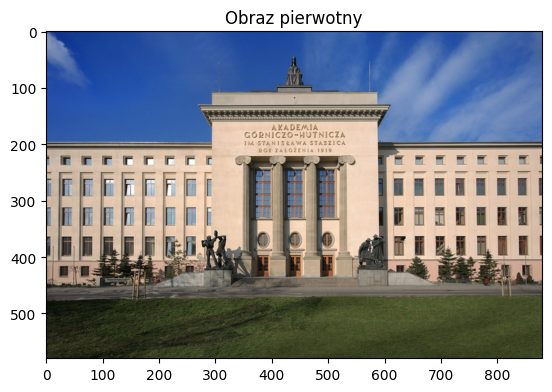

In [44]:
#Wyświetlenie wczytanego obrazu
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Obraz pierwotny')

### b)

In [45]:
scale_percent = 50 #zminiejszamy obraz o 50%
#obliczamy nowe wymiary
new_width = int(img.shape[1] * scale_percent / 100) 
new_height = int(img.shape[0] * scale_percent / 100)
dim = (new_width, new_height)

Aby zmienić rozmiar obrazu korzystamy z funkcji cv2.resize.
Funkcja ta poza samym obrazem przyjmuje dwa parametry u nas pierwszym jest nowy rozmiar obliczony wcześniej i podany wprost. Drugim jest algorytm interpolacji u nas cv2.INTER_AREA
czyli próbkowanie na podstawie obszaru.

In [46]:
#Zmiana rozmiaru obrazu
resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)

Text(0.5, 1.0, 'Obraz zminiejszony rozmiar o 50%')

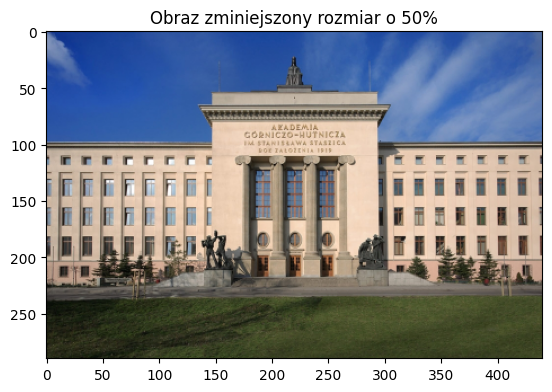

In [47]:
#Wyświatlenie wyniku
plt.imshow(cv2.cvtColor(resized, cv2.COLOR_BGR2RGB))
plt.title('Obraz zminiejszony rozmiar o 50%')

In [48]:
scale_percent = 150 #zwiększamy obraz o 50%
#obliczamy nowe wymiary
new_width = int(img.shape[1] * scale_percent / 100) 
new_height = int(img.shape[0] * scale_percent / 100)
dim = (new_width, new_height)

In [49]:
#Zmiana rozmiaru obrazu
resized = cv2.resize(img, dim, interpolation = cv2.INTER_NEAREST)

Metoda cv2.INTER_NEAREST wykorzystuje algorytm interpolacji najbliższego sąsiada. Zachowuje ona ostrość krawędzi, ale ogólny obraz może być rozmyty.

Text(0.5, 1.0, 'Obraz zwiększony rozmiar o 50%, interpolation = cv2.INTER_NEAREST')

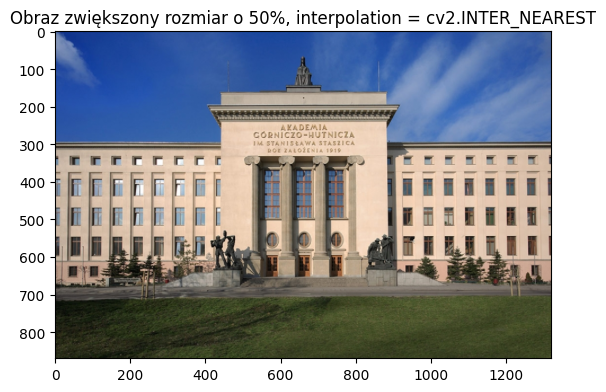

In [50]:
#Wyświatlenie wyniku
plt.imshow(cv2.cvtColor(resized, cv2.COLOR_BGR2RGB))
plt.title('Obraz zwiększony rozmiar o 50%, interpolation = cv2.INTER_NEAREST')

In [51]:
#Zmiana rozmiaru obrazu
resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)

Podczas powiększania obrazów INTER_AREA działa tak samo jak 
INTER_NEAREST. W innych przypadkach INTER_AREA działa lepiej przy
decymacji obrazu i unikaniu fałszywych wzorów wnioskowania na obrazach
(wzór mory).

Text(0.5, 1.0, 'Obraz zwiększony rozmiar o 50%, interpolation = cv2.INTER_AREA')

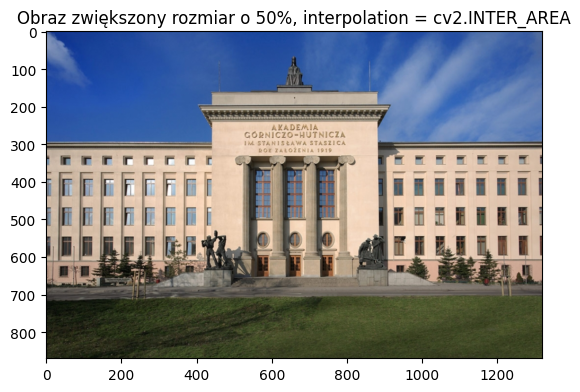

In [52]:
#Wyświatlenie wyniku
plt.imshow(cv2.cvtColor(resized, cv2.COLOR_BGR2RGB))
plt.title('Obraz zwiększony rozmiar o 50%, interpolation = cv2.INTER_AREA')

In [53]:
#Zmiana rozmiaru obrazu
resized = cv2.resize(img, dim, interpolation = cv2.INTER_LINEAR)

Metoda cv2.INTER_LINEAR wykorzystuje algorytm interpolacji bilinearnej. W przeciwieństwie do INTER_NEAREST, wykonuje ona interpolację w dwóch wymiarach i przewiduje funkcję używaną do obliczenia koloru piksela.
Algorytm ten jest skuteczny w obsłudze zniekształceń wizualnych podczas powiększania lub pomniejszania obrazu.

Text(0.5, 1.0, 'Obraz zwiększony rozmiar o 50%, interpolation = cv2.INTER_LINEAR')

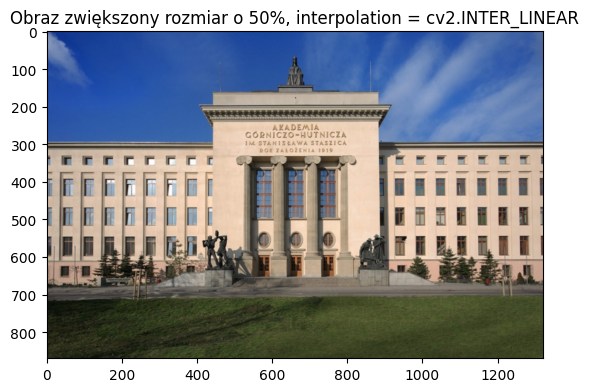

In [54]:
#Wyświatlenie wyniku
plt.imshow(cv2.cvtColor(resized, cv2.COLOR_BGR2RGB))
plt.title('Obraz zwiększony rozmiar o 50%, interpolation = cv2.INTER_LINEAR')

In [55]:
#Zmiana rozmiaru obrazu
resized = cv2.resize(img, dim, interpolation = cv2.INTER_CUBIC)

cv2.INTER_CUBIC jest bardziej złożoną metodą interpolacji, która wykorzystuje interpolację dwusześcienną do obliczania wartości pikseli na podstawie wartości otaczających je pikseli. Powoduje to uzyskanie gładszego i bardziej naturalnie wyglądającego obrazu, zwłaszcza przy powiększaniu obrazu.

Text(0.5, 1.0, 'Obraz zwiększony rozmiar o 50%, interpolation = cv2.INTER_CUBIC')

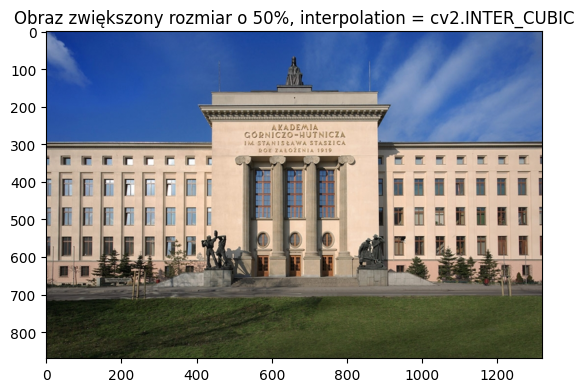

In [56]:
#Wyświatlenie wyniku
plt.imshow(cv2.cvtColor(resized, cv2.COLOR_BGR2RGB))
plt.title('Obraz zwiększony rozmiar o 50%, interpolation = cv2.INTER_CUBIC')

In [57]:
#Zmiana rozmiaru obrazu
resized = cv2.resize(img, dim, interpolation = cv2.INTER_LANCZOS4)

Text(0.5, 1.0, 'Obraz zwiększony rozmiar o 50%, interpolation = cv2.INTER_LANCZOS4')

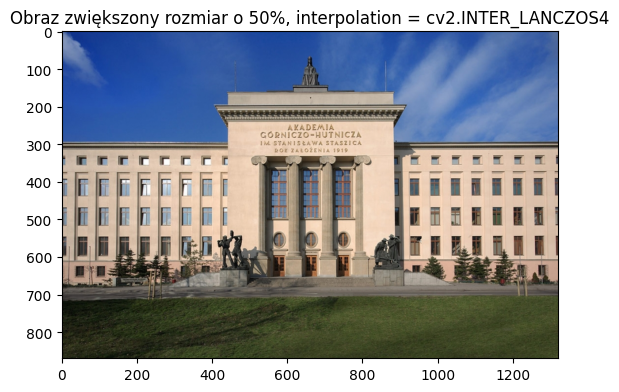

In [58]:
#Wyświatlenie wyniku
plt.imshow(cv2.cvtColor(resized, cv2.COLOR_BGR2RGB))
plt.title('Obraz zwiększony rozmiar o 50%, interpolation = cv2.INTER_LANCZOS4')

Podczas zwiększania rozmiaru obrazu o 50%, interpolacja metodą cv2.INTER_LANCZOS4 dała najlepsze rezultaty. Działa ona poprzez wzięcie średniej ważonej z sąsiedztwa 8x8 pikseli wokół miejsca docelowego przy użyciu okna Lanczosa.

### c)

Filtr uśredniający z macierzą K to rodzaj filtra obrazu, który wykorzystuje macierz kwadratową wag do uśredniania wartości pikseli w obrazie. Rozmiar macierzy, oznaczany przez K, określa ilość wygładzania zastosowanego do obrazu. Im większa wartość K, tym większe wygładzenie jest stosowane.

In [59]:
#Nałożenie filtru uśredniającego o macierzy K w rozmiarze 5x5  
img2kblur = cv2.blur(img,(5,5))

Text(0.5, 1.0, 'Obraz + filtr uśredniający o macierzy K w rozmiarze 5x5')

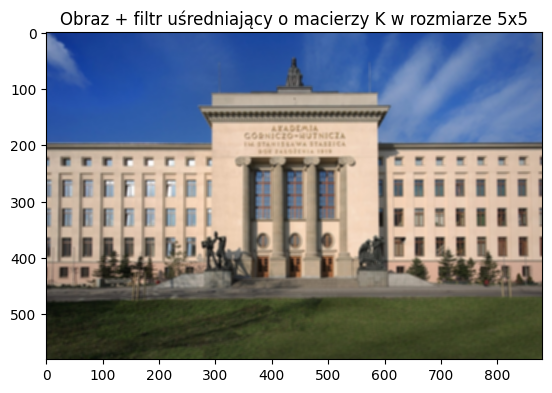

In [60]:
#Wyświatlenie wyniku
plt.imshow(cv2.cvtColor(img2kblur, cv2.COLOR_BGR2RGB))
plt.title('Obraz + filtr uśredniający o macierzy K w rozmiarze 5x5')

In [61]:
#Nałożenie filtru uśredniającego o macierzy K w rozmiarze 10x10
img3kblur = cv2.blur(img,(10,10))

Text(0.5, 1.0, 'Obraz + filtr uśredniający o macierzy K w rozmiarze 10x10')

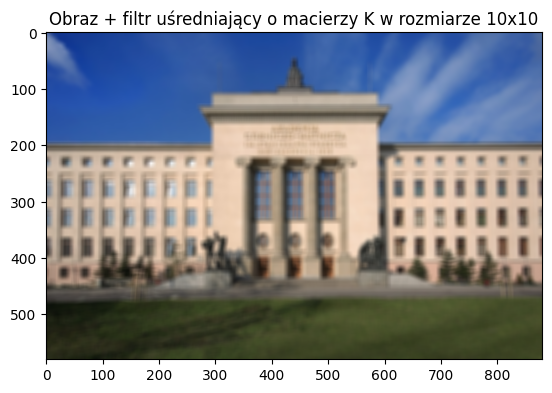

In [62]:
#Wyświatlenie wyniku
plt.imshow(cv2.cvtColor(img3kblur, cv2.COLOR_BGR2RGB))
plt.title('Obraz + filtr uśredniający o macierzy K w rozmiarze 10x10')

In [63]:
#Nałożenie filtru uśredniającego o macierzy K w rozmiarze 10x10
img4kblur = cv2.blur(img,(15,15))

Text(0.5, 1.0, 'Obraz + filtr uśredniający o macierzy K w rozmiarze 15x15')

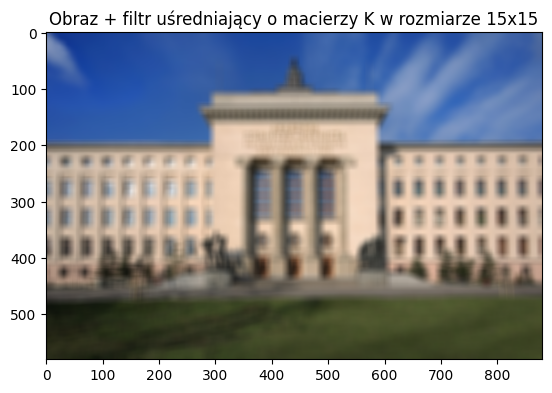

In [64]:
#Wyświatlenie wyniku
plt.imshow(cv2.cvtColor(img4kblur, cv2.COLOR_BGR2RGB))
plt.title('Obraz + filtr uśredniający o macierzy K w rozmiarze 15x15')

Efektem zastosowania filtru uśredniającego macierzy K o rosnącym rozmiarze macierzy jest wygładzenie obrazu i redukcja szumu. Wraz ze wzrostem rozmiaru macierzy na obrazie stosowane jest coraz większe wygładzenie, w wyniku czego powstaje gładszy, ale też potencjalnie bardziej rozmyty obraz.

### d)

Filtr medianowy to rodzaj filtra obrazu, który zastępuje każdy piksel w obrazie wartością mediany jego sąsiednich pikseli. Jest on powszechnie stosowany do usuwania z obrazów szumu typu "sól i pieprz". Rozmiar filtra, oznaczany przez K, określa rozmiar sąsiedztwa, nad którym obliczana jest mediana. Im większa wartość K, tym większe wygładzenie obrazu.

In [65]:
#Nałożenie filtr medianowego o rozmiarze 5x5  
img2mBlur =  cv2.medianBlur(img,5)

Text(0.5, 1.0, 'Obraz + filtr medianowy o rozmiarze 5x5')

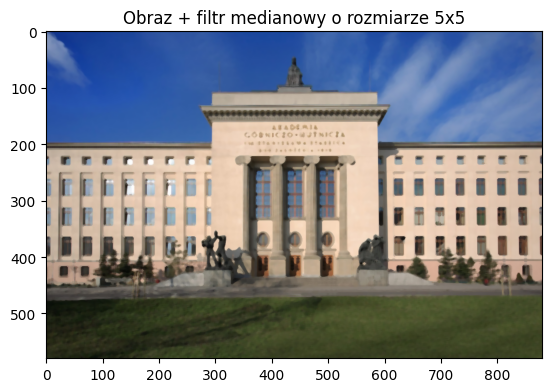

In [66]:
#Wyświatlenie wyniku
plt.imshow(cv2.cvtColor(img2mBlur, cv2.COLOR_BGR2RGB))
plt.title('Obraz + filtr medianowy o rozmiarze 5x5')

In [67]:
#Nałożenie filtru uśredniającego o rozmiarze 11x11  
img3mBlur =  cv2.medianBlur(img,11)

Text(0.5, 1.0, 'Obraz + filtr medianowy o rozmiarze 11x11')

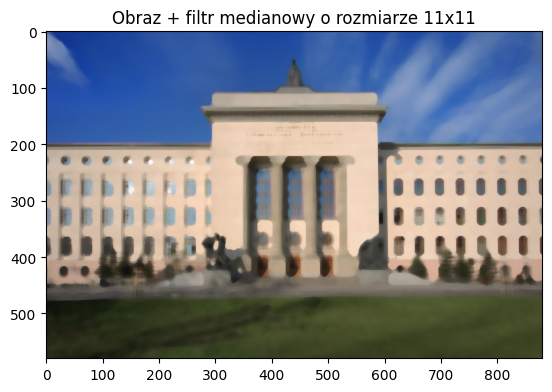

In [68]:
#Wyświatlenie wyniku
plt.imshow(cv2.cvtColor(img3mBlur, cv2.COLOR_BGR2RGB))
plt.title('Obraz + filtr medianowy o rozmiarze 11x11')

In [69]:
#Nałożenie filtru uśredniającego o rozmiarze 15x15 
img4mBlur =  cv2.medianBlur(img,15)

Text(0.5, 1.0, 'Obraz + filtr medianowy o rozmiarze 15x15')

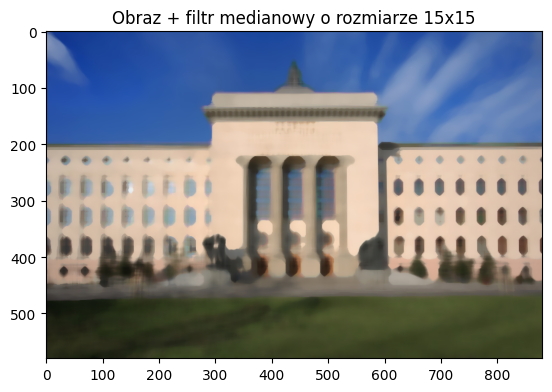

In [70]:
#Wyświatlenie wyniku
plt.imshow(cv2.cvtColor(img4mBlur, cv2.COLOR_BGR2RGB))
plt.title('Obraz + filtr medianowy o rozmiarze 15x15')

Efektem zastosowania filtru medianowego o rosnącym rozmiarze jest 
redukcja szumu w obrazie przy jednoczesnym zachowaniu krawędzi
i szczegółów obrazu. Wraz ze wzrostem rozmiaru na obrazie stosowane
jest coraz większe wygładzanie, w wyniku czego powstaje gładszy, ale 
też potencjalnie bardziej rozmyty obraz. Jednak filtr medianowy jest
generalnie lepszy w zachowaniu krawędzi i szczegółów niż filtr
uśredniający.

### e)

Filtr gaussowski jest rodzajem filtra liniowego, który wygładza obraz poprzez uśrednienie każdego piksela z sąsiednimi pikselami. Uśrednianie jest ważone w taki sposób, że piksele znajdujące się najbliżej środka jądra wnoszą więcej do średniej niż piksele znajdujące się dalej. To ważenie jest oparte na rozkładzie gaussowskim, który jest krzywą w kształcie dzwonu, używaną do modelowania wielu zjawisk naturalnych.

In [71]:
#Nałożenie filtru gaussowskiego o rozmiarze 5x5 
img2gBlur =  cv2.GaussianBlur(img,(5,5),0) 

Text(0.5, 1.0, 'Obraz +  filtr gaussowski o rozmiarze 5')

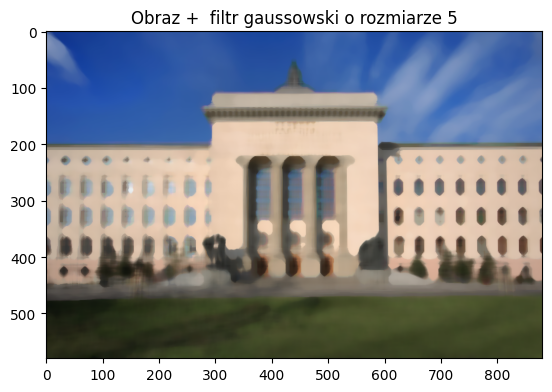

In [72]:
#Wyświatlenie wyniku
plt.imshow(cv2.cvtColor(img4mBlur, cv2.COLOR_BGR2RGB))
plt.title('Obraz +  filtr gaussowski o rozmiarze 5')

Efektem zastosowania filtra gaussowskiego jest wygładzenie obrazu z zachowaniem krawędzi i szczegółów obrazu. Wielkość wygładzenia jest kontrolowana przez rozmiar jądra i parametr odchylenia standardowego (sigma). Większy rozmiar jądra i/lub większa wartość sigma spowoduje większe wygładzenie. W praktyce wybór rozmiaru jądra i wartości sigma zależy od poziomu szumu w obrazie i pożądanego poziomu wygładzenia.

### f)

In [73]:
#Konwersja obrazu do skali szarości
grayscale = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#Nakładanie filtrów
img2kBlurgray = cv2.blur(grayscale, (5,5))
img2gBlurgray = cv2.GaussianBlur(grayscale, (5,5), 0)
img2mBlurgray = cv2.medianBlur(grayscale, 5)

In [74]:
#Binaryzacja bez filtracji
ret, threshold = cv2.threshold(grayscale, 127, 255, cv2.THRESH_BINARY)

Text(0.5, 1.0, 'Obraz zbinaryzowany')

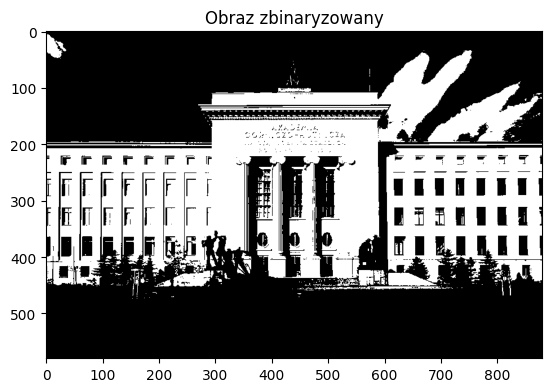

In [75]:
#Wyświatlenie obrazu zbinaryzowanego
plt.imshow(threshold, cmap='gray')
plt.title('Obraz zbinaryzowany')

In [76]:
#Binaryzacja filtr uśredniający o macierzy K w rozmiarze 5x5,
ret, threshold = cv2.threshold(img2kBlurgray, 127, 255, cv2.THRESH_BINARY)

Text(0.5, 1.0, 'Obraz zbinaryzowany po przefiltrowaniu - filtr uśredniający')

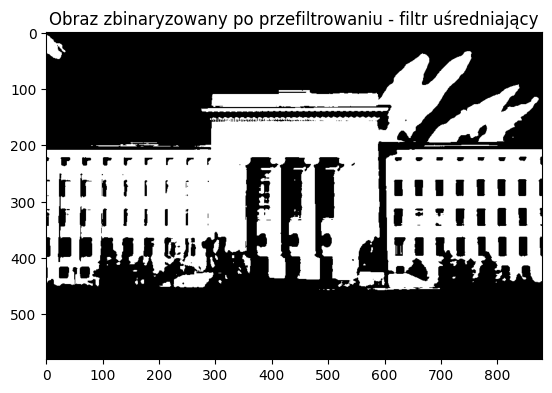

In [77]:
#Wyświatlenie obrazu po przefiltrowaniu
plt.imshow(threshold, cmap='gray')
plt.title('Obraz zbinaryzowany po przefiltrowaniu - filtr uśredniający')

In [78]:
#Binaryzacja filtr medianowy o macierzy K w rozmiarze 5x5,
ret, threshold = cv2.threshold(img2mBlurgray, 127, 255, cv2.THRESH_BINARY)

Text(0.5, 1.0, 'Obraz zbinaryzowany po przefiltrowaniu - filtr medianowy')

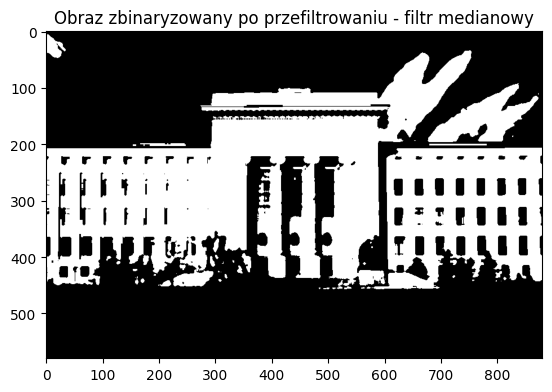

In [79]:
#Wyświatlenie obrazu po przefiltrowaniu
plt.imshow(threshold, cmap='gray')
plt.title('Obraz zbinaryzowany po przefiltrowaniu - filtr medianowy')

In [80]:
#Binaryzacja filtr gaussowski o rozmiarze 5
ret, threshold = cv2.threshold(img2gBlurgray, 127, 255, cv2.THRESH_BINARY)

Text(0.5, 1.0, 'Obraz zbinaryzowany po przefiltrowaniu - filtr gaussowski')

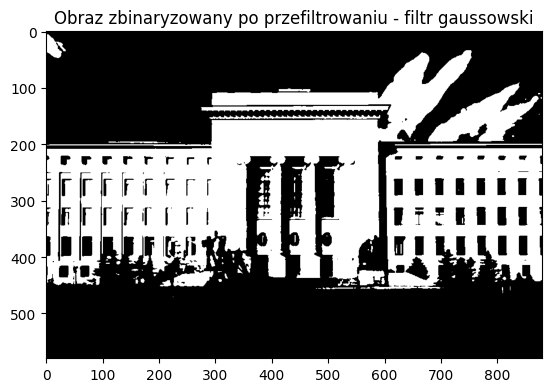

In [81]:
#Wyświatlenie obrazu po przefiltrowaniu
plt.imshow(threshold, cmap='gray')
plt.title('Obraz zbinaryzowany po przefiltrowaniu - filtr gaussowski')

Filtrowanie obrazu przed binaryzacją pomaga w usunięciu
szumu i poprawieniu dokładności progowania

### g)

Zasada działania filtra Roberts cross polega na obliczeniu różnic luminancji pikseli położonych koło siebie po przekątnych, a następnie dodaniu ich wartości bezwzględnych. Obliczenie różnic można zapisać jako splot macierzy obrazu z każdą z przedstawionych poniżej macierzy o wymiarach 2x2.

In [82]:
#Nakładanie filtra Roberts cross
roberts_x = np.array([[0, 1], [-1, 0]])
roberts_y = np.array([[1, 0], [0, -1]])
roberts_x_img = cv2.filter2D(grayscale, -1, roberts_x)
roberts_y_img = cv2.filter2D(grayscale, -1, roberts_y)
roberts_img = np.sqrt(np.power(roberts_x_img, 2) + np.power(roberts_y_img, 2))


Text(0.5, 1.0, 'Obraz po przefiltrowaniu - filtr Roberts cross')

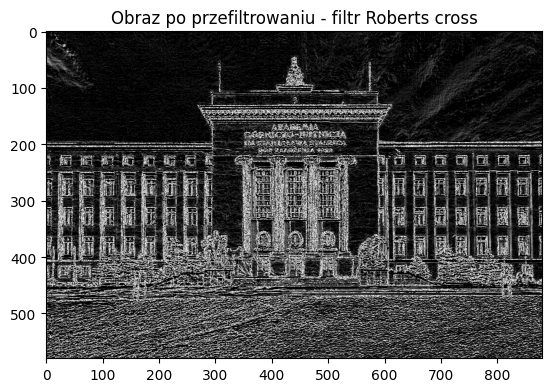

In [83]:
#Wyświatlenie obrazu po przefiltrowaniu
plt.imshow(roberts_img, cmap='gray')
plt.title('Obraz po przefiltrowaniu - filtr Roberts cross')

Filtr Prewitta wykorzystuje macierz 3x3 z wartościami, które podkreślają poziome i pionowe krawędzie w obrazie. Konwertuje on macierz z obrazem, aby obliczyć wielkość gradientu w każdym pikselu. Wielkość ta jest następnie progowana w celu określenia, czy jest to krawędź, czy nie.

In [84]:
#Nakładanie filtra Prewitta
prewitt_x = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
prewitt_y = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
prewitt_x_img = cv2.filter2D(grayscale, -1, prewitt_x)
prewitt_y_img = cv2.filter2D(grayscale, -1, prewitt_y)
prewitt_img = np.sqrt(np.power(prewitt_x_img, 2) + np.power(prewitt_y_img, 2))

Text(0.5, 1.0, 'Obraz po przefiltrowaniu - filtr Prewitta')

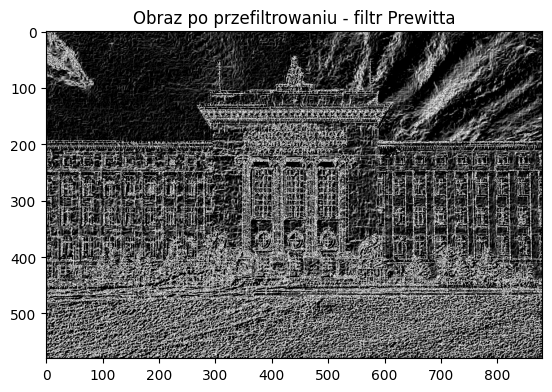

In [85]:
#Wyświatlenie obrazu po przefiltrowaniu
plt.imshow(prewitt_img, cmap='gray')
plt.title('Obraz po przefiltrowaniu - filtr Prewitta')

Filtr Sobela również wykorzystuje macierz 3x3, ale o nieco innych wartościach niż filtr Prewitta. Filtr Sobela oblicza wielkość gradientu obrazu poprzez konwolucję filtra z obrazem. Jest on dokładniejszy niż filtr Prewitta, ponieważ nadaje większą wagę pikselom znajdującym się bliżej środka filtra.

In [86]:
#Nakładanie filtra Sobela
sobel_x = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])
sobel_y = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]])
sobel_x_img = cv2.filter2D(grayscale, -1, sobel_x)
sobel_y_img = cv2.filter2D(grayscale, -1, sobel_y)
sobel_img = np.sqrt(np.power(sobel_x_img, 2) + np.power(sobel_y_img, 2))

Text(0.5, 1.0, 'Obraz po przefiltrowaniu - filtr Sobela')

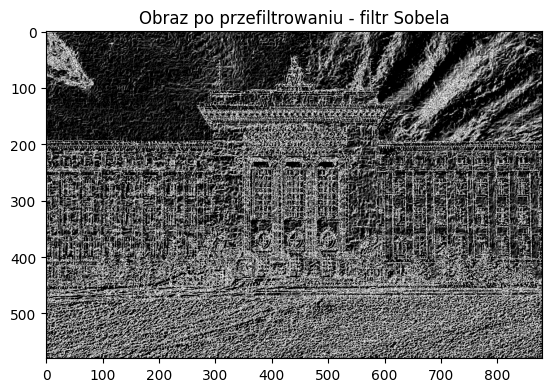

In [87]:
#Wyświatlenie obrazu po przefiltrowaniu
plt.imshow(sobel_img, cmap='gray')
plt.title('Obraz po przefiltrowaniu - filtr Sobela')

W powyższym kodzie definiujemy jądra filtrów Roberts cross, Prewitt i Sobel jako tablice numpy. Stosujemy filtry za pomocą cv2.filter2D i obliczamy wielkość gradientu za pomocą wzoru sqrt(Gx^2 + Gy^2), gdzie Gx i Gy są przefiltrowanymi obrazami z odpowiednim filtrem.